# Evaluation the Different Models in Different Levels

### Setup

In [ ]:
!apt-get install openslide-tools
!pip install openslide-python
%matplotlib inline
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from google.colab import drive
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray
import random
import shutil
drive.mount('/content/gdrive')

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libopenslide0
Suggested packages:
  libtiff-tools
The following NEW packages will be installed:
  libopenslide0 openslide-tools
0 upgraded, 2 newly installed, 0 to remove and 14 not upgraded.
Need to get 92.5 kB of archives.
After this operation, 268 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libopenslide0 amd64 3.4.1+dfsg-2 [79.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 openslide-tools amd64 3.4.1+dfsg-2 [12.7 kB]
Fetched 92.5 kB in 1s (144 kB/s)
Selecting previously unselected package libopenslide0.
(Reading database ... 144865 files and directories currently installed.)
Preparing to unpack .../libopenslide0_3.4.1+dfsg-2_amd64.deb ...
Unpacking libopenslide0 (3.4.1+dfsg-2) ...
Selecting previously unselected package openslide-tools.
Preparing to unpack 

In [ ]:
# Read WSI
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

In [ ]:
# get the validate percentage of a image
def tissue_pixels_percentage(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    tissue_pixels = list(zip(indices[0], indices[1]))
    percentage = len(tissue_pixels) / float(image.shape[0] * image.shape[0])
    return percentage

In [ ]:
def myImageShow(tumor, mask_tumor):
  plt.figure(figsize=(20,20), dpi=100)
  plt.subplot(131)
  plt.imshow(tumor)
  plt.subplot(132)
  plt.imshow(mask_tumor)
  plt.subplot(133)
  plt.imshow(tumor)
  plt.imshow(mask_tumor, cmap = "jet", alpha = 0.5)
  plt.show()

In [ ]:
# Create Heatmap for the Test Slide
def heatmap(slide_dir, mask_slide_dir, BATCH_SIZE, level):
  test = open_slide(slide_dir)
  test_mask = open_slide(mask_slide_dir)
  width = test.level_dimensions[level][0]
  height = test.level_dimensions[level][1]
  mask = np.zeros((height, width))
  h_num = height // BATCH_SIZE
  w_num = width // BATCH_SIZE
  TrueNegative = 0
  FalsePositive = 0
  TruePositive = 0
  FalseNegative = 0
  factor = 2 ** level
  for i in range(h_num):
    for j in range(w_num):
      sub_tumor_test = read_slide(test, 
                          x = j * factor * BATCH_SIZE, 
                          y = i * factor * BATCH_SIZE,
                          level = level, 
                          width = BATCH_SIZE, 
                          height = BATCH_SIZE) / 255
      if tissue_pixels_percentage(sub_tumor_test) < 0.2:
        continue
      sub_tumor_mask_test = read_slide(test_mask,
                               x = j * factor * BATCH_SIZE,
                               y = i * factor * BATCH_SIZE,
                               level = level,
                               width = BATCH_SIZE,
                               height = BATCH_SIZE)[:, :, 0]
      result = model.predict(sub_tumor_test.reshape(1, BATCH_SIZE, BATCH_SIZE, 3))
      if result[0][1] > 0.85:
        mask[i * BATCH_SIZE: i * BATCH_SIZE + BATCH_SIZE, j * BATCH_SIZE: j * BATCH_SIZE + BATCH_SIZE] = 1
        if np.any(sub_tumor_mask_test == 1):
          TruePositive += 1
        else:
          FalsePositive += 1
      else:
        if np.any(sub_tumor_mask_test == 1):
          FalseNegative += 1
        else:
          TrueNegative += 1

  return mask, TruePositive, FalsePositive, TrueNegative, FalseNegative

## Using the test set, which we selected in the preprocess, to test the models performance




In [ ]:
#110 091 078
testset = ["110", "078", "091"]

for subset in testset: 
  slide_path = 'tumor_%s.tif' % subset # only this file is available
  tumor_mask_path = 'tumor_%s_mask.tif' % subset # only this file is available

  slide_url = 'https://storage.googleapis.com/applied-dl/tumor-slides/%s' % slide_path
  mask_url = 'https://storage.googleapis.com/applied-dl/tumor-slides/%s' % tumor_mask_path

  # Download the whole slide image
  if not os.path.exists(slide_path):
    !curl -O $slide_url

  # Download the tumor mask
  if not os.path.exists(tumor_mask_path):
    !curl -O $mask_url

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1416M  100 1416M    0     0   114M      0  0:00:12  0:00:12 --:--:--  124M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 31.3M  100 31.3M    0     0  28.6M      0  0:00:01  0:00:01 --:--:-- 28.6M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1626M  100 1626M    0     0   100M      0  0:00:16  0:00:16 --:--:--  120M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 49.7M  100 49.7M    0     0  77.6M      0 --:--:-- --:--:-- --:--:-- 77.6M
  % Total    % Received % Xferd  Average Speed   Tim

## Level 2 (Xception Model)

In [ ]:
model = tf.keras.models.load_model("/content/gdrive/MyDrive/MyModels/my_model_level_2_Xception_final_model_1.h5")

### tumor_078

In [ ]:
tumor_slides = 'tumor_078.tif'
tumor_mask_slides = 'tumor_078_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 2
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 708
FalsePositive: 152
TrueNegative: 1454
FalseNegative: 331
The precision of the model is 82.33% 
The recall of the model is 68.14% 
The accuracy is 81.74% 
The F1_score is 74.57%


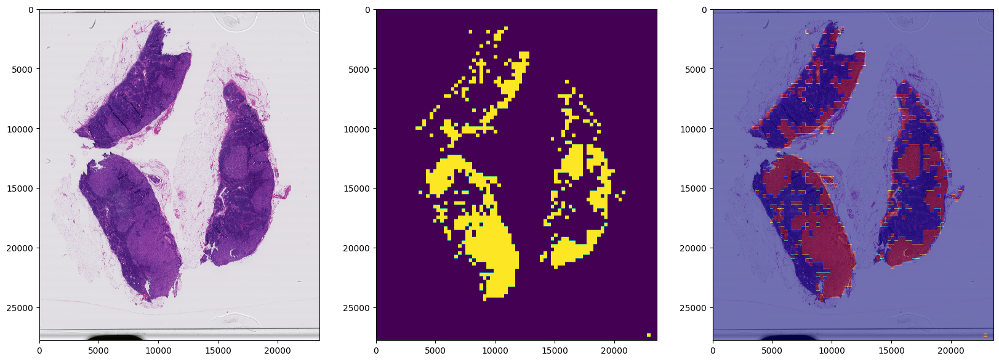

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

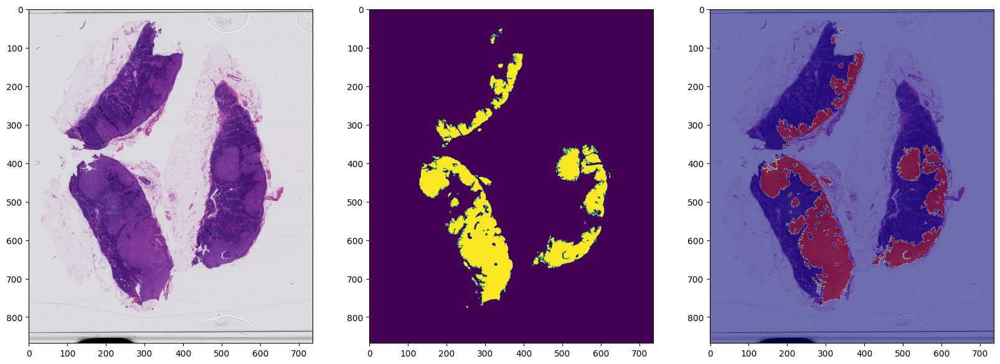

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

### tumor_091

In [ ]:
tumor_slides = 'tumor_091.tif'
tumor_mask_slides = 'tumor_091_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 2
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 25
FalsePositive: 12
TrueNegative: 705
FalseNegative: 46
The precision of the model is 67.57% 
The recall of the model is 35.21% 
The accuracy is 92.64% 
The F1_score is 46.30%


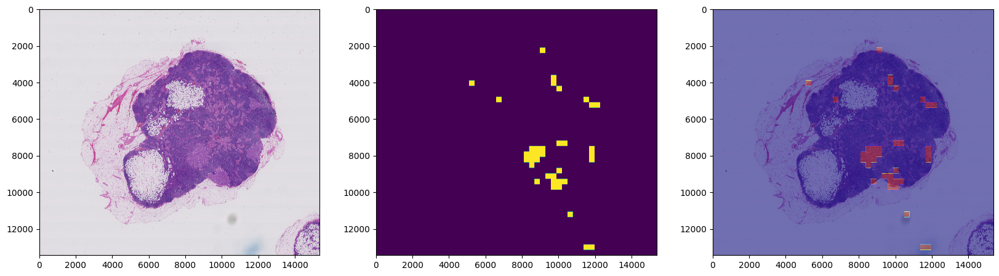

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

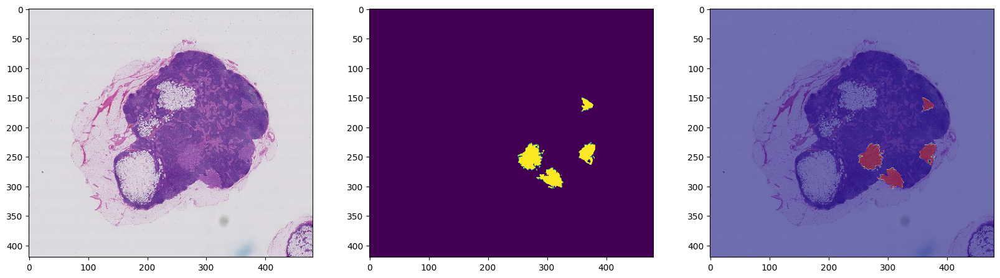

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

### tumor_110

In [ ]:
tumor_slides = 'tumor_110.tif'
tumor_mask_slides = 'tumor_110_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 2
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 810
FalsePositive: 34
TrueNegative: 669
FalseNegative: 115
The precision of the model is 95.97% 
The recall of the model is 87.57% 
The accuracy is 90.85% 
The F1_score is 91.58%


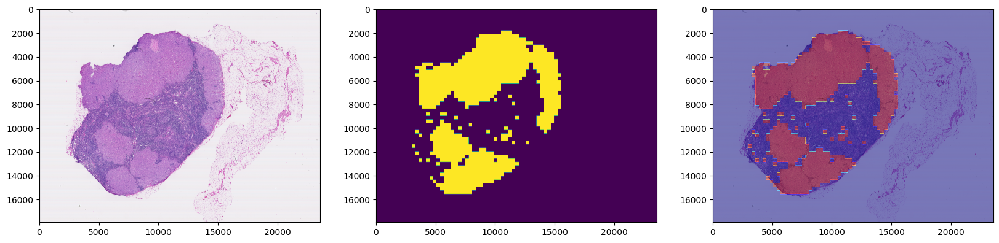

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

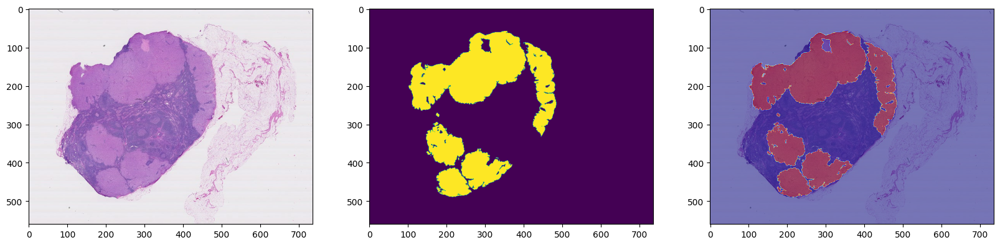

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

## Level 2 (Custom Model)

In [ ]:
model = tf.keras.models.load_model("/content/gdrive/MyDrive/MyModels/my_model_level_2_custom_final_model_1.h5")

###tumor_078

In [ ]:
tumor_slides = 'tumor_078.tif'
tumor_mask_slides = 'tumor_078_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 2
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 751
FalsePositive: 232
TrueNegative: 1374
FalseNegative: 288
The precision of the model is 76.40% 
The recall of the model is 72.28% 
The accuracy is 80.34% 
The F1_score is 74.28%


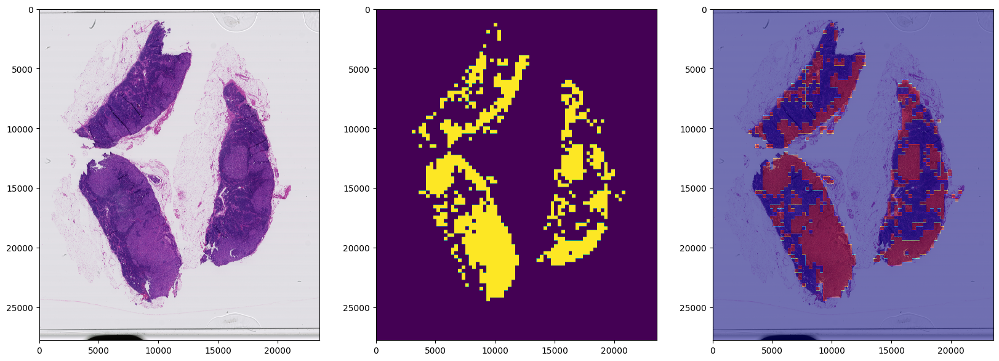

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

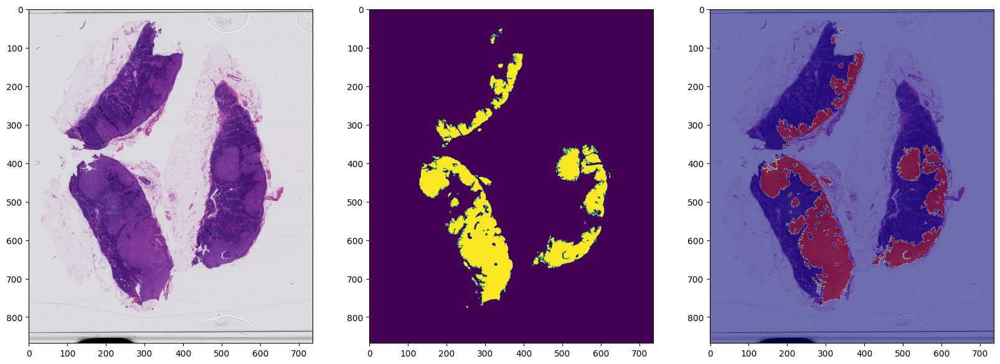

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

###tumor_091

In [ ]:
tumor_slides = 'tumor_091.tif'
tumor_mask_slides = 'tumor_091_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 2
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 55
FalsePositive: 156
TrueNegative: 561
FalseNegative: 16
The precision of the model is 26.07% 
The recall of the model is 77.46% 
The accuracy is 78.17% 
The F1_score is 39.01%


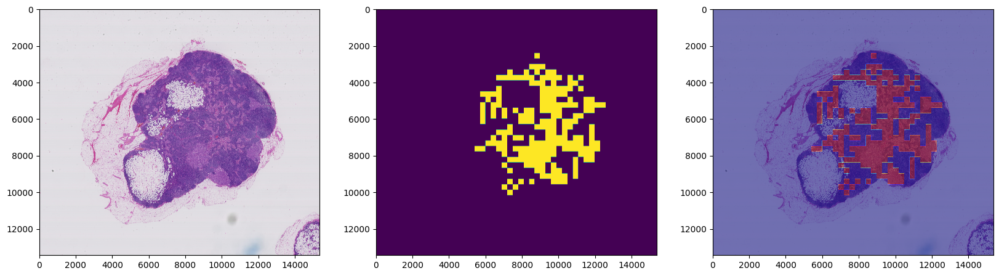

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

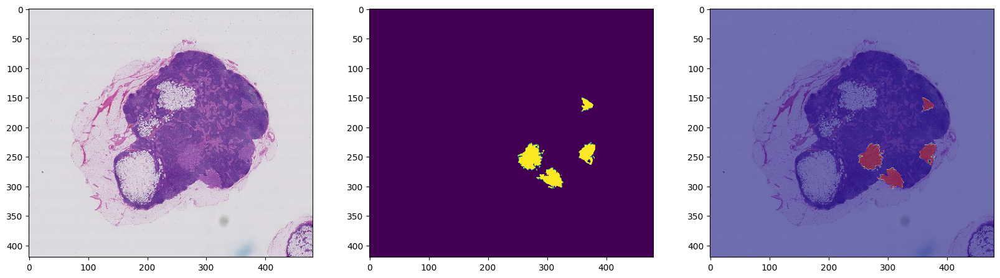

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

###tumor_110

In [ ]:
tumor_slides = 'tumor_110.tif'
tumor_mask_slides = 'tumor_110_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 2
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 836
FalsePositive: 213
TrueNegative: 490
FalseNegative: 89
The precision of the model is 79.69% 
The recall of the model is 90.38% 
The accuracy is 81.45% 
The F1_score is 84.70%


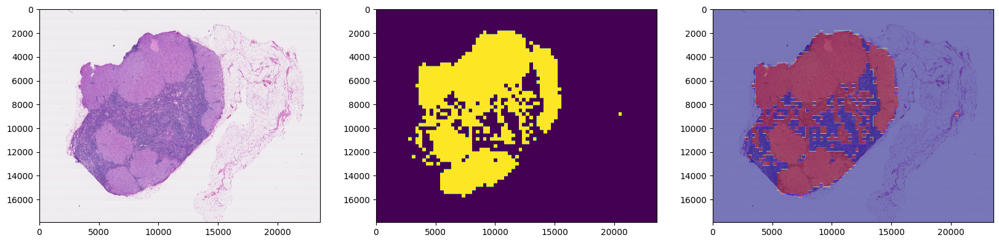

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

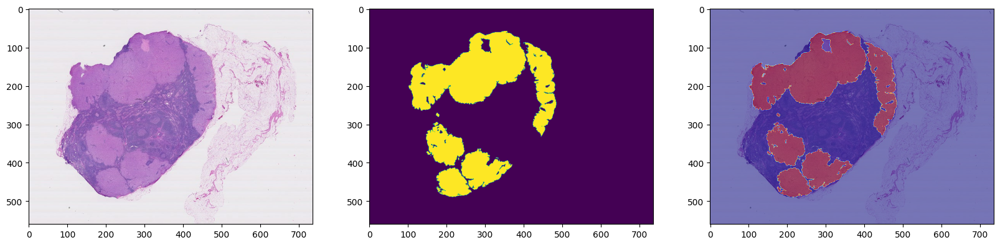

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

# Level 3 (Xception)

In [ ]:
model = tf.keras.models.load_model("/content/gdrive/MyDrive/MyModels/my_model_level_3_Xception_final_model_1.h5")

# tumor_078

In [ ]:
tumor_slides = 'tumor_078.tif'
tumor_mask_slides = 'tumor_078_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 3
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 105
FalsePositive: 16
TrueNegative: 350
FalseNegative: 212
The precision of the model is 86.78% 
The recall of the model is 33.12% 
The accuracy is 66.62% 
The F1_score is 47.95%


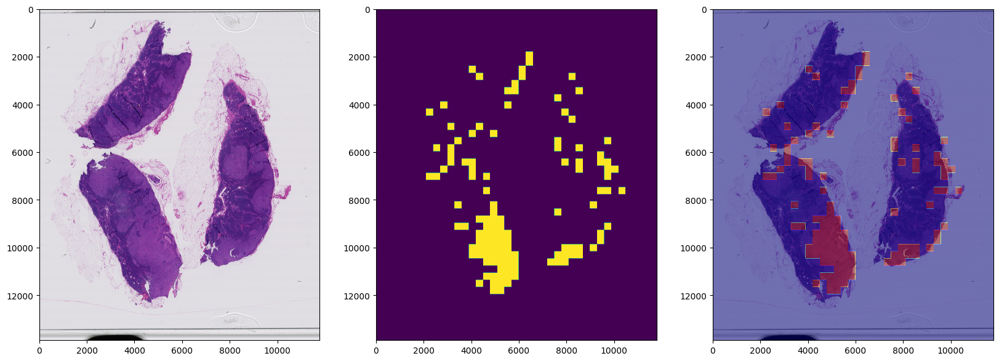

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

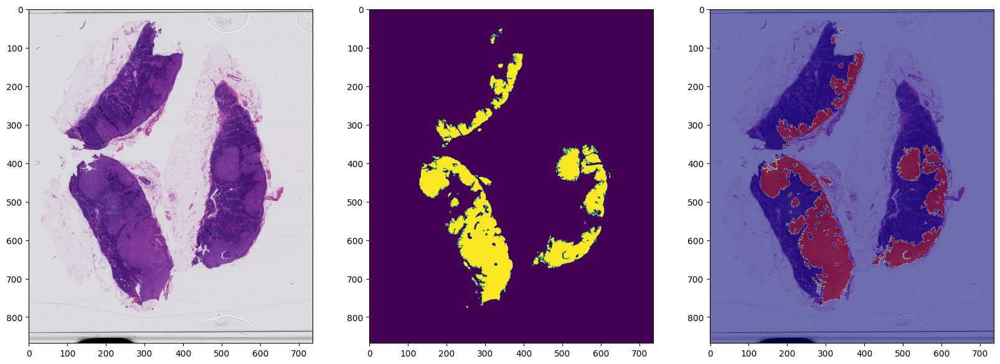

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

### tumor_091

In [ ]:
tumor_slides = 'tumor_091.tif'
tumor_mask_slides = 'tumor_091_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 3
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 14
FalsePositive: 16
TrueNegative: 162
FalseNegative: 13
The precision of the model is 46.67% 
The recall of the model is 51.85% 
The accuracy is 85.85% 
The F1_score is 49.12%


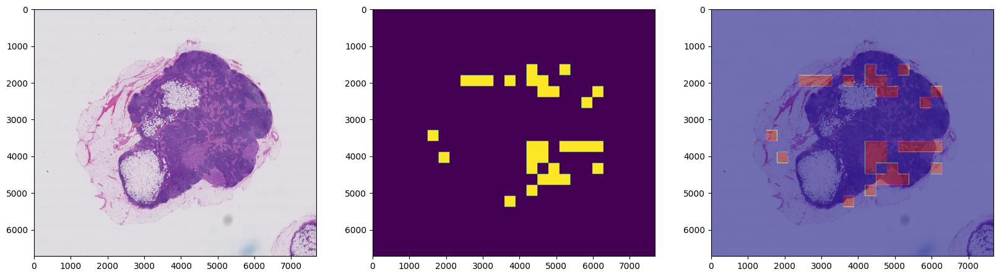

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

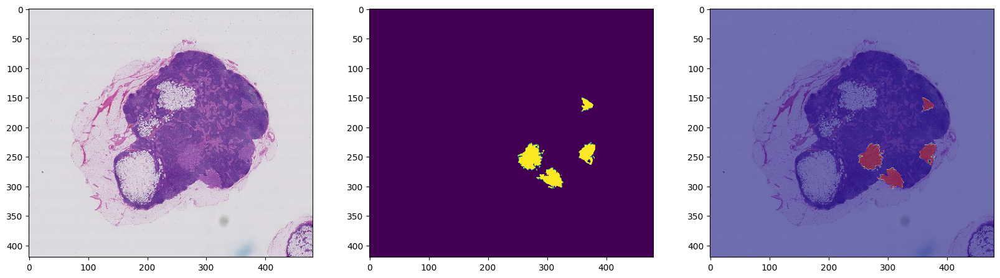

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

### tumor_110

In [ ]:
tumor_slides = 'tumor_110.tif'
tumor_mask_slides = 'tumor_110_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 3
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 213
FalsePositive: 13
TrueNegative: 140
FalseNegative: 51
The precision of the model is 94.25% 
The recall of the model is 80.68% 
The accuracy is 84.65% 
The F1_score is 86.94%


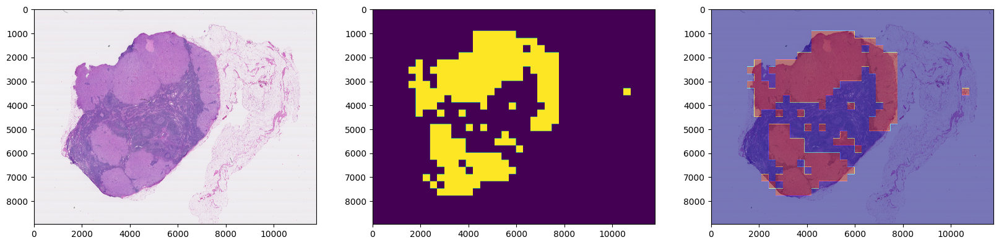

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

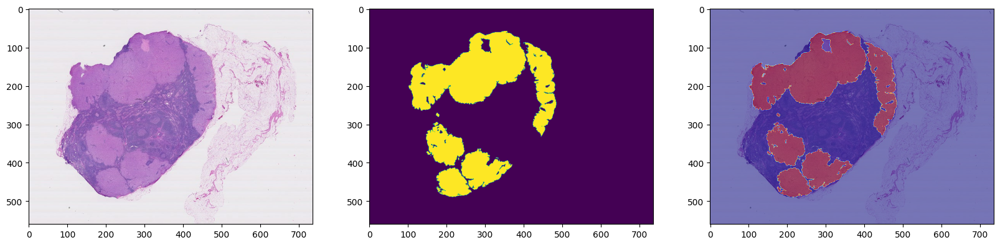

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

# Level 3 (Custom Model)

In [ ]:
model = tf.keras.models.load_model("/content/gdrive/MyDrive/MyModels/my_model_level_3_custom_final_model_1.h5")

### tumor_078

In [ ]:
tumor_slides = 'tumor_078.tif'
tumor_mask_slides = 'tumor_078_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 3
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 25
FalsePositive: 52
TrueNegative: 314
FalseNegative: 292
The precision of the model is 32.47% 
The recall of the model is 7.89% 
The accuracy is 49.63% 
The F1_score is 12.69%


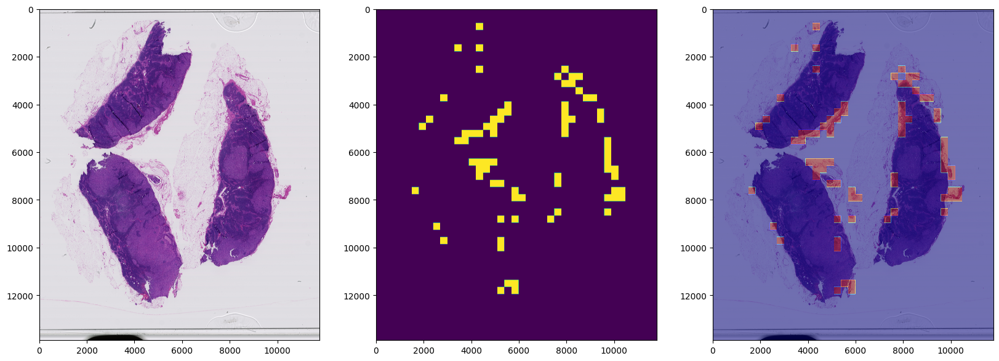

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

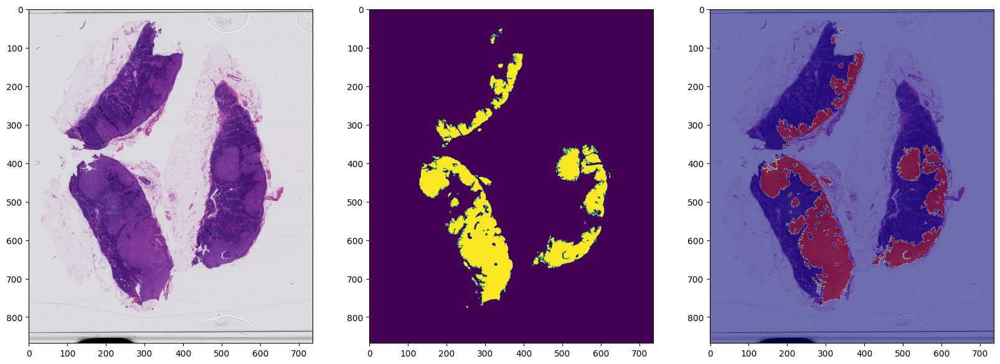

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

### tumor_091

In [ ]:
tumor_slides = 'tumor_091.tif'
tumor_mask_slides = 'tumor_091_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 3
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 14
FalsePositive: 13
TrueNegative: 165
FalseNegative: 13
The precision of the model is 51.85% 
The recall of the model is 51.85% 
The accuracy is 87.32% 
The F1_score is 51.85%


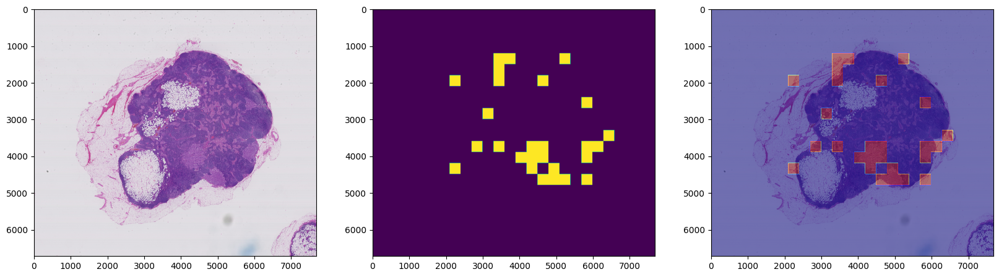

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

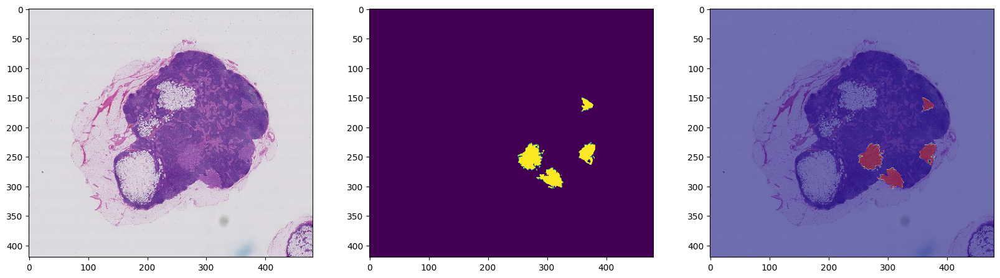

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

### tumor_110

In [ ]:
tumor_slides = 'tumor_110.tif'
tumor_mask_slides = 'tumor_110_mask.tif'
slide = '/content/{}'.format(tumor_slides)
mask_slide = '/content/{}'.format(tumor_mask_slides)
level = 3
BATCH_SIZE = 299
mask, TruePositive, FalsePositive, TrueNegative, FalseNegative = heatmap(slide, mask_slide, BATCH_SIZE, level)
print("TruePositive: {}".format(TruePositive))
print("FalsePositive: {}".format(FalsePositive))
print("TrueNegative: {}".format(TrueNegative))
print("FalseNegative: {}".format(FalseNegative))
Precision = TruePositive / (TruePositive + FalsePositive)
Recall = TruePositive / (TruePositive + FalseNegative)
Accuracy = (TruePositive + TrueNegative) / (TruePositive + TrueNegative + FalsePositive + FalseNegative)
F1_score = 2 * (Precision * Recall) / (Precision + Recall)
print("The precision of the model is {:.2f}% \nThe recall of the model is {:.2f}% \nThe accuracy is {:.2f}% \nThe F1_score is {:.2f}%".format(Precision * 100, Recall * 100, Accuracy * 100, F1_score * 100))

TruePositive: 231
FalsePositive: 17
TrueNegative: 136
FalseNegative: 33
The precision of the model is 93.15% 
The recall of the model is 87.50% 
The accuracy is 88.01% 
The F1_score is 90.23%


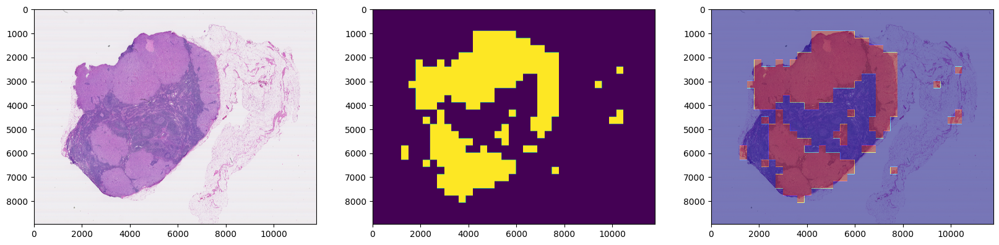

In [ ]:
slide = open_slide('/content/{}'.format(tumor_slides))
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
myImageShow(tumor, mask)

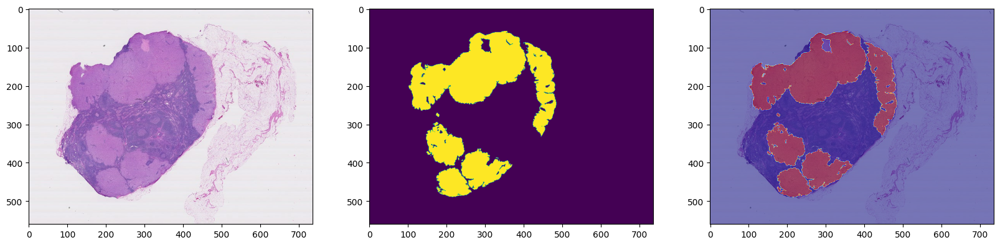

In [ ]:
tumor_dir = '/content/{}'.format(tumor_slides)
tumor_mask_dir = '/content/{}'.format(tumor_mask_slides)
slide = open_slide(tumor_dir)
slide_mask = open_slide(tumor_mask_dir)
level = 7
tumor = read_slide(slide, 
                     x = 0, 
                     y = 0,
                     level = level, 
                     width = slide.level_dimensions[level][0], 
                     height = slide.level_dimensions[level][1])
mask_tumor = read_slide(slide_mask, 
                          x = 0, 
                          y = 0,
                          level = level, 
                          width = slide.level_dimensions[level][0], 
                          height = slide.level_dimensions[level][1])
mask_tumor = mask_tumor[:, :, 0]
myImageShow(tumor, mask_tumor)

# Conclusion
In the evaluation process, I test four models: two models in level 2 and two models in level 3. By comparing the heatmap, recall, precision and accuracy of four different models:
1. The level 2 models have better performance than the level 3 models.
2. The Xception model is better than the custom model with the same level (which is not the same with the result in the research: [Detecting Cancer Metastases on Gigapixel Pathology Images](https://arxiv.org/pdf/1703.02442.pdf), the reason maybe the dataset of my project is much smaller than the research) and the converge speed of Xception is higher.
3. The model having the best performance is the model of Xception model in level 2. 